In [1]:
import poppy
import proper
import roman_phasec_proper
import numpy as np
import astropy.units as u
import astropy.io.fits as fits
from scipy.ndimage import rotate

from pathlib import Path
from glob import glob

from importlib import reload
import misc

use_opds = True

pupil_diam_pix = 1000
waves_dir = Path('C:/Users/Kian/Desktop/roman-waves/phasec/spc-spec')

optics = ['pupil', 'primary', 'secondary', 'pomafold', 'm3', 'm4', 'm5', 'ttfold', 'fsm', 'oap1', 
          'focm', 'oap2', 'dm1', 'dm2', 'oap3', 'fold3', 'oap4', 'spm', 'oap5', 'fpm', 'oap6',
          'lyotstop', 'oap7', 'fieldstop', 'oap8', 'filter', 'lens1', 'lens2', 'fold4', 'image']
poppy_fnames = []
proper_fnames = []
for i,optic in enumerate(optics):
    if use_opds:
        if optic=='fpm' or optic=='lyotstop' or optic=='fieldstop' or optic=='lens2' or optic=='fold4' or optic=='image':
            poppy_fname = glob( str(waves_dir/('*'+optic+'_poppy.fits')) )
        elif optic=='lens1': poppy_fname = glob( str(waves_dir/('*lens_opd_poppy.fits')) )
        else: poppy_fname = glob( str(waves_dir/('*'+optic+'_opd_poppy.fits')) )
    else:
        poppy_fname = glob( str(waves_dir/('*'+optic+'_poppy.fits')) )
    proper_fname = glob( str(waves_dir/('*'+optic+'_proper.fits')) )
    print(i);print(poppy_fname);print(proper_fname);print()
    if len(proper_fname)>0:
        poppy_fnames.append(poppy_fname[0])
        proper_fnames.append(proper_fname[0])

0
[]
[]

1
['C:\\Users\\Kian\\Desktop\\roman-waves\\phasec\\spc-spec\\wf_primary_opd_poppy.fits']
['C:\\Users\\Kian\\Desktop\\roman-waves\\phasec\\spc-spec\\wf_primary_proper.fits']

2
['C:\\Users\\Kian\\Desktop\\roman-waves\\phasec\\spc-spec\\wf_secondary_opd_poppy.fits']
['C:\\Users\\Kian\\Desktop\\roman-waves\\phasec\\spc-spec\\wf_secondary_proper.fits']

3
['C:\\Users\\Kian\\Desktop\\roman-waves\\phasec\\spc-spec\\wf_pomafold_opd_poppy.fits']
['C:\\Users\\Kian\\Desktop\\roman-waves\\phasec\\spc-spec\\wf_pomafold_proper.fits']

4
['C:\\Users\\Kian\\Desktop\\roman-waves\\phasec\\spc-spec\\wf_m3_opd_poppy.fits']
['C:\\Users\\Kian\\Desktop\\roman-waves\\phasec\\spc-spec\\wf_m3_proper.fits']

5
['C:\\Users\\Kian\\Desktop\\roman-waves\\phasec\\spc-spec\\wf_m4_opd_poppy.fits']
['C:\\Users\\Kian\\Desktop\\roman-waves\\phasec\\spc-spec\\wf_m4_proper.fits']

6
['C:\\Users\\Kian\\Desktop\\roman-waves\\phasec\\spc-spec\\wf_m5_opd_poppy.fits']
['C:\\Users\\Kian\\Desktop\\roman-waves\\phasec\\sp

In [11]:
poppy_fnames[12][53:-11]

'dm2'

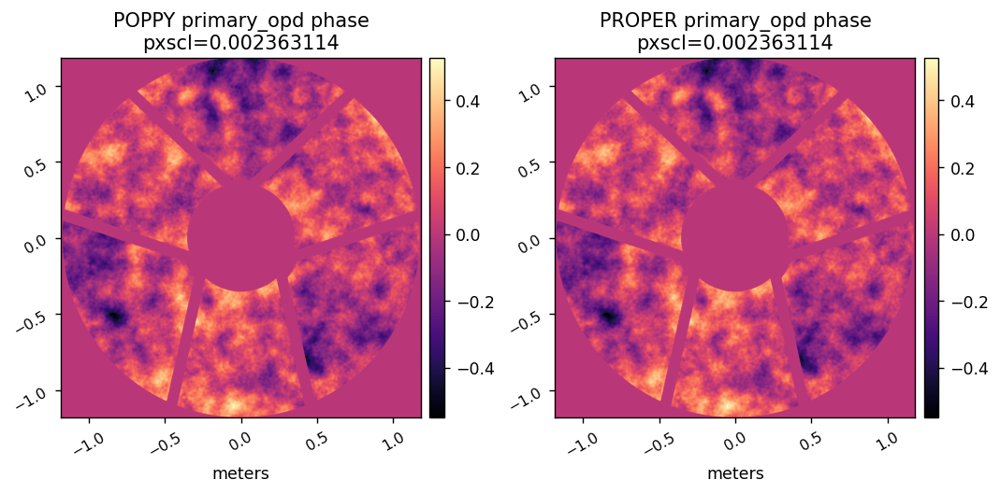

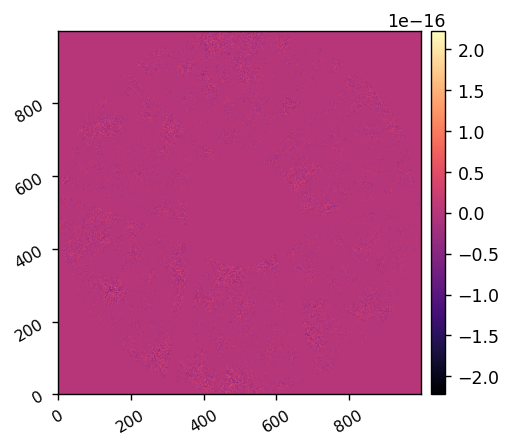

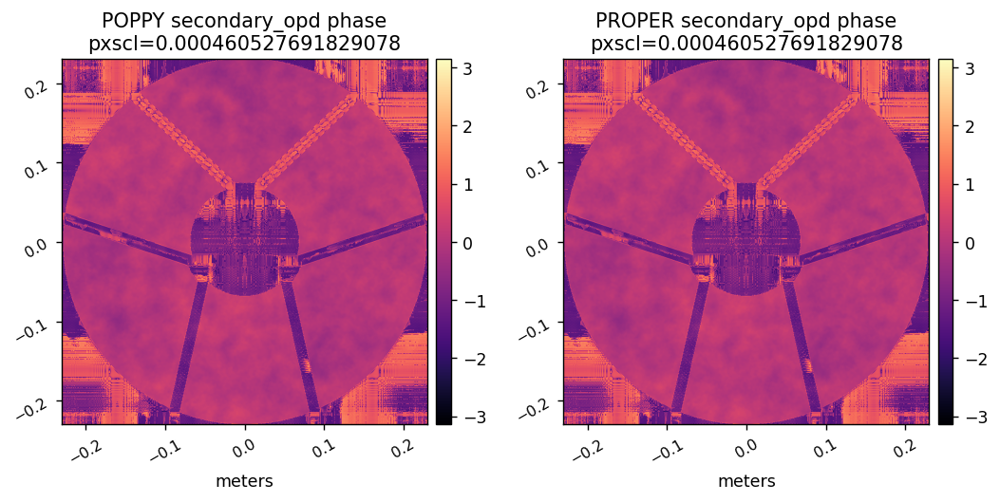

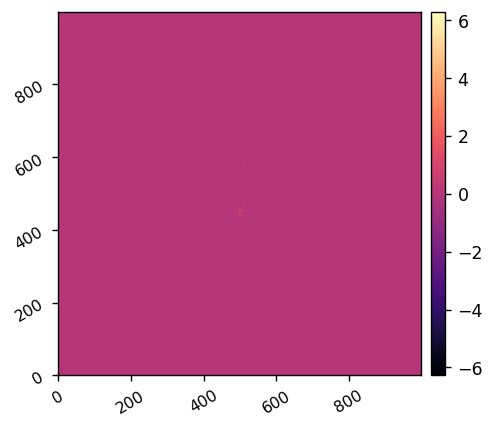

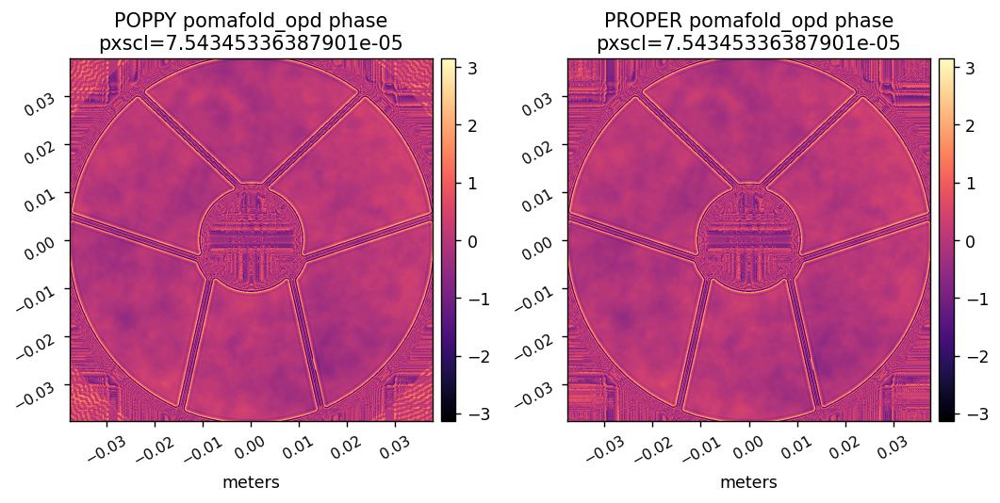

...

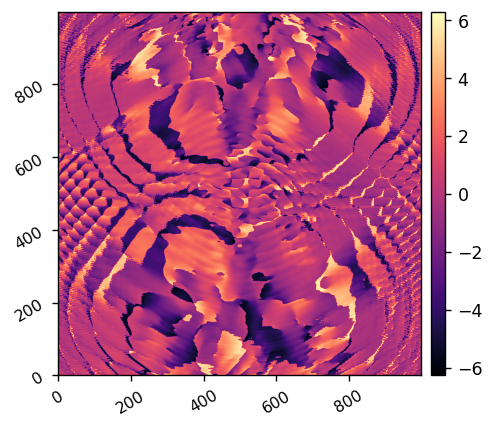

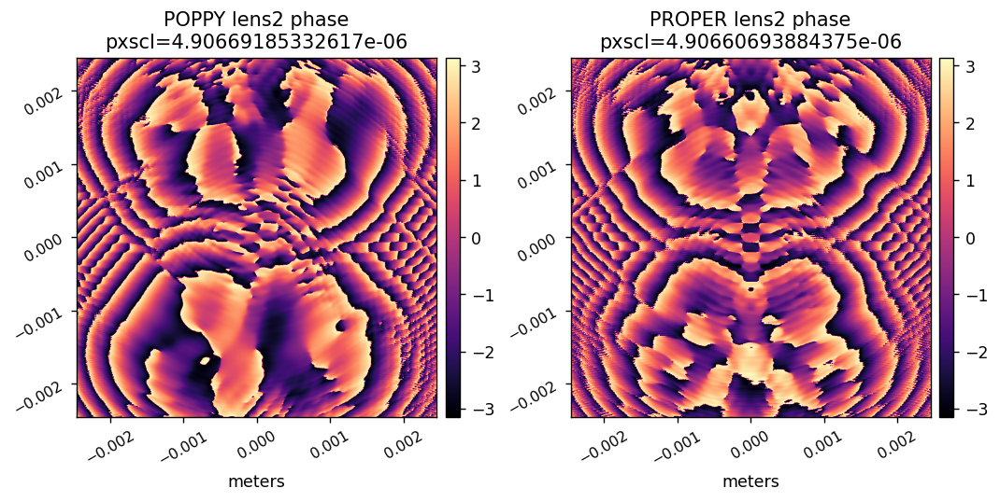

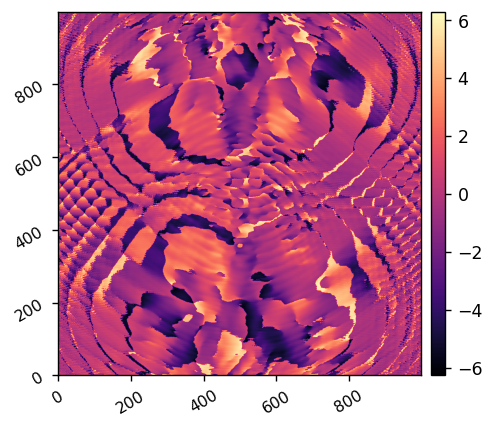

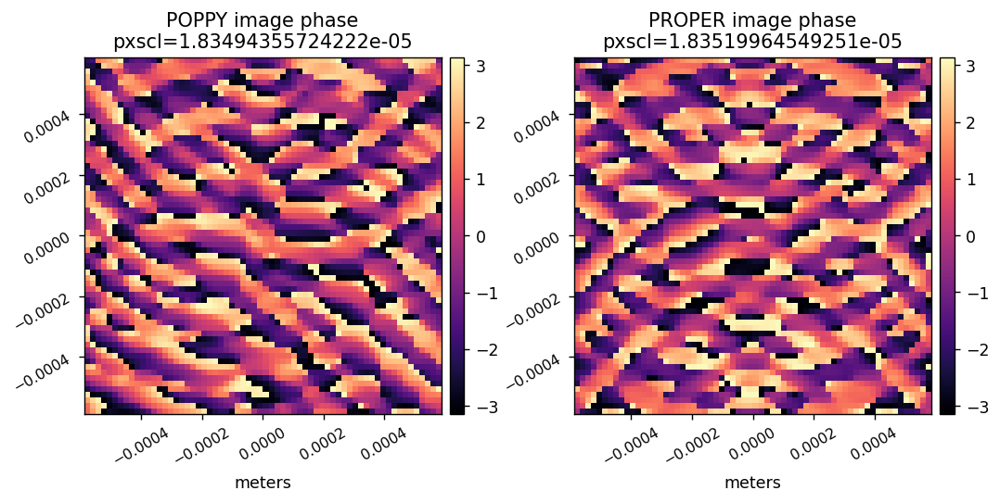

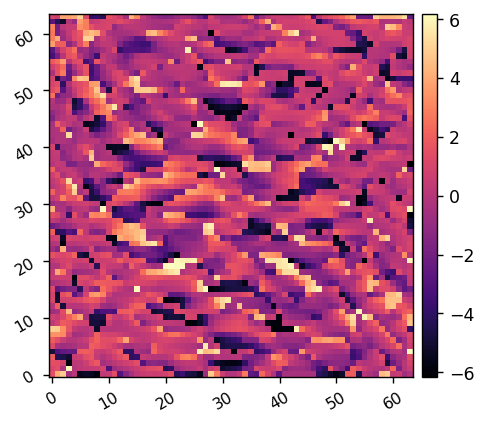

In [2]:
reload(misc)

show = 'intensity'
show = 'phase'
show_diff = True

if show=='intensity': 
    data_ind = 0
    lognorm=True
elif show=='phase': 
    data_ind = 1
    lognorm=False
    
for i in range(len(poppy_fnames)):
    poppy_data = fits.getdata(poppy_fnames[i])[data_ind]
    poppy_pxscl = fits.getheader(poppy_fnames[i])['PIXELSCL']*u.m/u.pix
    
    proper_data = fits.getdata(proper_fnames[i])[data_ind]
    proper_pxscl = fits.getheader(proper_fnames[i])['PIXELSCL']*u.m/u.pix
    
    if 'fpm' in poppy_fnames[i] or 'fieldstop' in poppy_fnames[i] or 'image' in poppy_fnames[i]:
        poppy_data = rotate(misc.pad_or_crop(poppy_data, 64), 180)
        proper_data = np.roll(np.roll(misc.pad_or_crop(proper_data, 64), -1, axis=0), -1, axis=1)
    else:
        poppy_data = misc.pad_or_crop(poppy_data, pupil_diam_pix)
        proper_data = misc.pad_or_crop(proper_data, pupil_diam_pix)
        
    optic = poppy_fnames[i][53:-11]
    misc.myimshow2(poppy_data, proper_data, 
                   'POPPY '+optic+' '+show+'\n'+'pxscl={}'.format(poppy_pxscl.value), 
                   'PROPER '+optic+' '+show+'\n'+'pxscl={}'.format(proper_pxscl.value), 
                   pxscl1=poppy_pxscl, pxscl2=proper_pxscl,
                   lognorm1=lognorm, lognorm2=lognorm)
    if show_diff: misc.myimshow(poppy_data-proper_data)

# For comparing initial polarization aberrations.

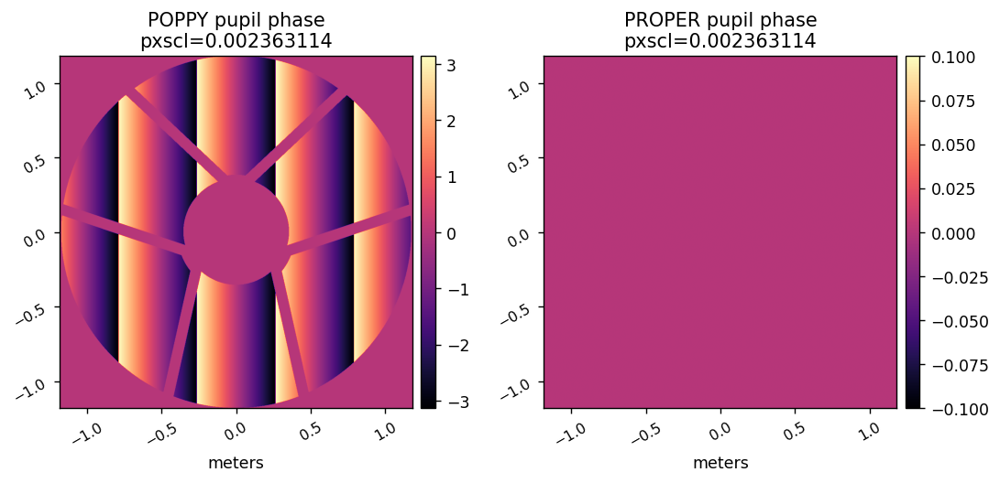

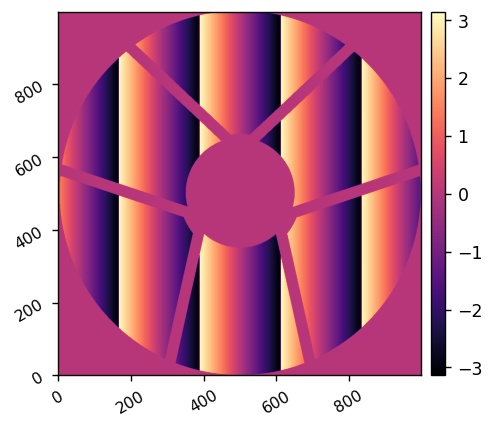

In [5]:
show = 'intensity'
show = 'phase'
show_diff = True

if show=='intensity': 
    data_ind = 0
    lognorm=True
elif show=='phase': 
    data_ind = 1
    lognorm=False
    
poppy_fname = str(waves_dir/'wf_pupil_poppy.fits')
proper_fname = str(waves_dir/'wf_polmap_proper.fits')

poppy_data = fits.getdata(poppy_fname)[data_ind]
poppy_pxscl = fits.getheader(poppy_fname)['PIXELSCL']*u.m/u.pix

proper_data = fits.getdata(proper_fname)[data_ind]
proper_pxscl = fits.getheader(proper_fname)['PIXELSCL']*u.m/u.pix

poppy_data = misc.pad_or_crop(poppy_data, pupil_diam_pix)
proper_data = misc.pad_or_crop(proper_data, pupil_diam_pix)

optic = 'pupil'
misc.myimshow2(poppy_data, proper_data, 
               'POPPY '+optic+' '+show+'\n'+'pxscl={}'.format(poppy_pxscl.value), 
               'PROPER '+optic+' '+show+'\n'+'pxscl={}'.format(proper_pxscl.value), 
               pxscl1=poppy_pxscl, pxscl2=proper_pxscl,
               lognorm1=lognorm, lognorm2=lognorm)
if show_diff: misc.myimshow(poppy_data-proper_data)